In [2]:
import pandas as pd
import seaborn as sns
import numpy as np

donwload the dataset and put under `data`

## Load user responses

In [3]:
data = pd.read_csv('data/train_data/train_task_3_4.csv')
print(max(data['QuestionId']))

947


# Calculate Correctness and Select Entropy

In [4]:
#Make Selection Entropy list
real_entropy = []
for k,df in data.groupby('QuestionId'):
    freq = df["AnswerValue"].value_counts()
    entropy = -sum([prob*np.log(prob) for prob in freq/sum(freq)]) 
    real_entropy.append(entropy)
    df["Entropy"] = entropy
#print(real_entropy) 

[1.194456119275689, 0.8760057656431737, 1.3316632075619683, 0.6954225533991739, 1.3243211426168569, 1.1622062319419575, 1.2084903053048706, 1.3404960767116414, 1.3089144701741104, 1.270139859237986, 1.3273512551803335, 1.2750108870210033, 1.2138634976524971, 0.9167804629806295, 0.9821856587021622, 1.0397207708399179, 1.09043291571841, 1.3091720856211175, 1.357900573920328, 1.049648735111362, 0.9583061715974811, 1.3083837519625987, 0.9728192230998342, 1.2838580568279494, 1.0800747279419627, 0.6885025570777227, 1.174473541805139, 1.2795165223081921, 1.1148026162328304, 1.0352915371392668, 1.2262358309863937, 0.9607417068965622, 1.3248791615627689, 1.3862943611198906, 1.2103214342882118, 1.1820159592671018, 1.3070198783198173, 1.0943493455246185, 1.242500575712098, 1.2756493257833188, 1.3611114462639233, 1.2703756469536676, 1.3390654297229818, 0.8159869004823121, 1.3091029796183653, 1.2704160901924488, 1.275083705457424, 1.0916844702461859, 1.3255134780837037, 1.2794718426282587, 1.096564

Text(0, 0.5, 'Entropy')

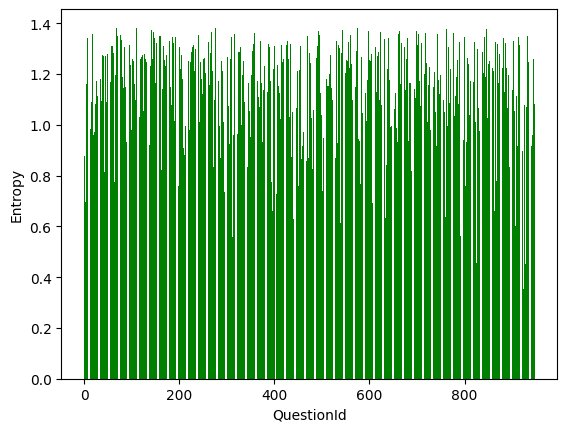

In [5]:
import matplotlib.pyplot as plt
for i in range(len(real_entropy)):
    plt.bar(i,real_entropy[i],color = 'green')
#plt.bar(real_entropy)
plt.xlabel('QuestionId')
plt.ylabel('Entropy')



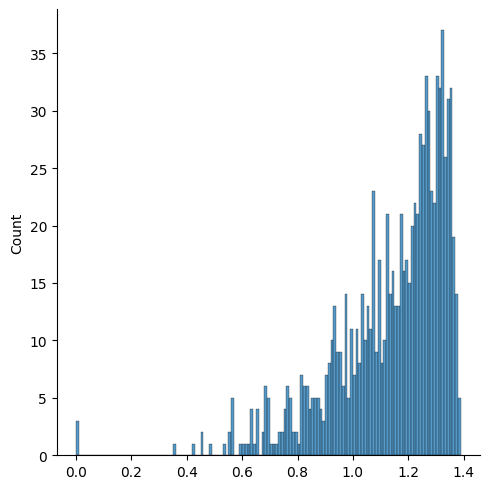

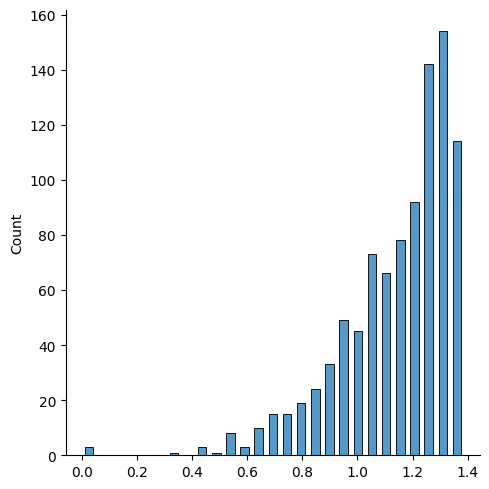

In [6]:
import seaborn as sns
sns.displot(real_entropy, binwidth=0.01)
sns.displot(real_entropy,shrink=.6)

<Axes: >

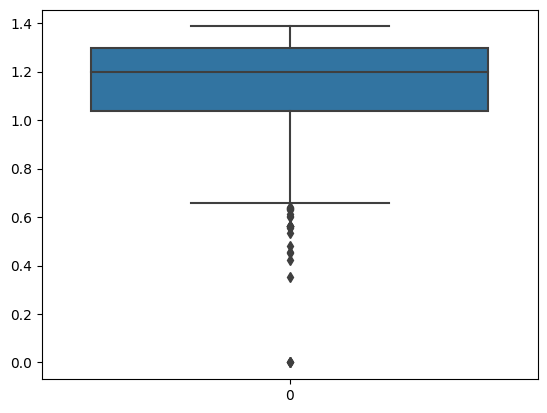

In [7]:
sns.boxplot(real_entropy)

In [8]:
#make Correctness list
correctness = []
for k,df in data.groupby('QuestionId'):

    correct = df['IsCorrect'].mean()
    correctness.append(correct)
    
#print(correctness)

[0.44345661450924606, 0.5714285714285714, 0.3852140077821012, 0.8087574850299402, 0.4014084507042254, 0.1908763505402161, 0.5285215366705471, 0.34831460674157305, 0.3919209282337774, 0.36330935251798563, 0.4020356234096692, 0.45831414094887146, 0.3991769547325103, 0.6965845909451946, 0.6682380671773719, 0.5, 0.5834782608695652, 0.42924528301886794, 0.3175333640128854, 0.6355869242199108, 0.6338605741066198, 0.40875912408759124, 0.618519842688595, 0.44905008635578586, 0.6194061062317022, 0.8116182572614108, 0.5282392026578073, 0.45169600686990125, 0.4888888888888889, 0.6161849710982659, 0.507643085673658, 0.6719858156028369, 0.38571428571428573, 0.25, 0.49099485420240135, 0.5161290322580645, 0.407496977025393, 0.6055408970976254, 0.4959709911361805, 0.45607978519370923, 0.3501346671796845, 0.3343949044585987, 0.3614457831325301, 0.75, 0.3259566620562471, 0.4266263237518911, 0.2638997650743931, 0.59500693481276, 0.381903642773208, 0.45301112389719983, 0.5885792913656691, 0.52907311456534

Text(0, 0.5, 'Correctness')

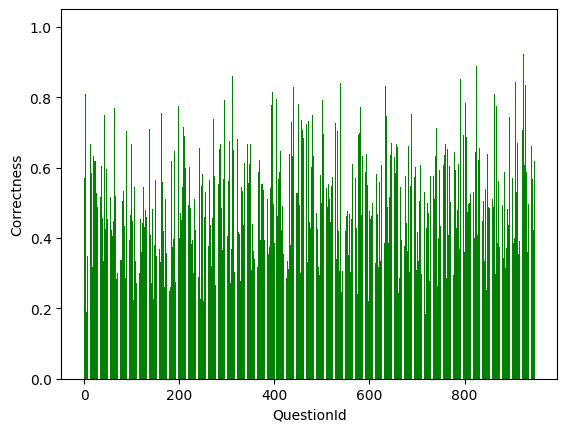

In [9]:
#plotting Correctness group by questionId
import matplotlib.pyplot as plt
for i in range(len(correctness)):
    plt.bar(i,correctness[i],color = 'green')
#plt.bar(real_entropy)
plt.xlabel('QuestionId')
plt.ylabel('Correctness')

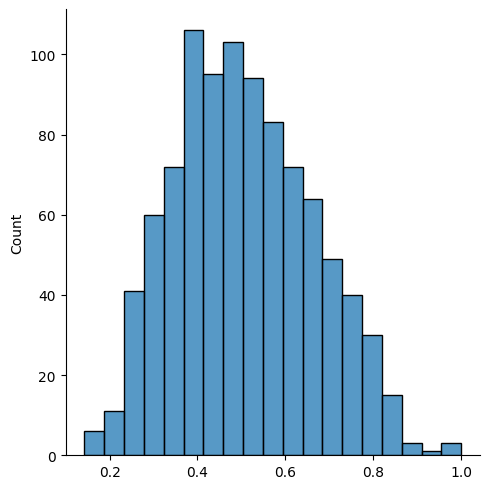

In [10]:
sns.displot(correctness)

<Axes: >

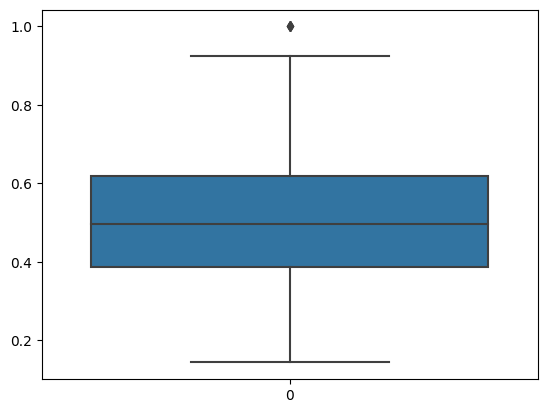

In [11]:
sns.boxplot(correctness)

# Make train data

In [12]:
con_li = [] #To get confindence

# I'll add one feature(confidence)

Load confidence group by QuestionID and if confidence == None than I'll set avg(confidence)

In [13]:
conf_data = pd.read_csv('data/metadata/answer_metadata_task_3_4.csv')
cc = []
# calc percent of correct for each question
for k,df in conf_data.groupby('AnswerId'):
    cc.append(df['Confidence'])
    

In [14]:
conf_data = pd.read_csv('data/metadata/answer_metadata_task_3_4.csv')
con_avg = conf_data['Confidence'].mean()

In [15]:
print(con_avg)

73.60870382358469


In [16]:
# calc percent of correct for each question
for k,df in data.groupby('QuestionId'):
    #print(k, len(df['AnswerId']),list(df['AnswerId']))
    con_li.append(list(df['AnswerId']))


In [17]:

#print(con_li)

[[282545, 1319001, 42788, 351023, 853279, 319834, 351443, 604540, 270611, 1076027, 1038133, 669531, 1365079, 115381, 1287264, 595598, 359012, 335971, 160297, 1432463, 1305032, 1387823, 440367, 473543, 939359, 166307, 541524, 230178, 218558, 807184, 610214, 465631, 257762, 439461, 87133, 235071, 965444, 80837, 1073937, 376066, 1258314, 656056, 1283174, 1209272, 1151471, 1300370, 791114, 1502415, 610637, 1334305, 472168, 796080, 1285294, 505336, 367077, 1056711, 569547, 865735, 1170082, 1089406, 198857, 1288649, 695498, 407341, 299203, 712679, 451001, 1002948, 676311, 459412, 1190437, 1101015, 469111, 392257, 953483, 1388459, 1170158, 970451, 1258357, 820545, 589936, 389872, 230298, 1011793, 1040502, 826772, 90533, 493564, 1360113, 831709, 111913, 405838, 186786, 515166, 5988, 960497, 1098256, 1367210, 162095, 820649, 295453, 748387, 382051, 1434783, 781590, 565374, 295736, 824803, 97344, 121884, 454231, 149935, 339199, 373443, 1023201, 82588, 804622, 1148609, 11757, 903642, 700775, 1456

In [18]:
import pandas as pd

# asd.csv 파일을 pandas DataFrame으로 로드
asd_df = pd.read_csv('data/metadata/answer_metadata_task_3_4.csv')

# bsd.csv 파일을 pandas DataFrame으로 로드
bsd_df = pd.read_csv('data/train_data/train_task_3_4.csv')

# asd_df와 bsd_df를 AnswerId 열을 기준으로 병합
merged_df = pd.merge(bsd_df, asd_df[['AnswerId', 'Confidence']], on='AnswerId', how='left')

# Confidence 열을 가장 상단에 추가
merged_df = pd.concat([merged_df['Confidence'], merged_df.drop('Confidence', axis=1)], axis=1)

# 병합된 DataFrame을 새로운 CSV 파일로 저장
merged_df.to_csv('merged.csv', index=False)





In [19]:
import pandas as pd
import numpy as np
final_train_data = []
confidence_data = []
t_data = pd.read_csv('merged.csv')

# calc percent of correct for each question
for k, df in t_data.groupby('QuestionId'):
    confidence_mean = df['Confidence'].mean()
    if np.isnan(confidence_mean):
        confidence_mean = con_avg
    confidence_data.append(confidence_mean)
    final_train_data.append([k,correctness[k], real_entropy[k], confidence_mean])


Text(0, 0.5, 'Confidence')

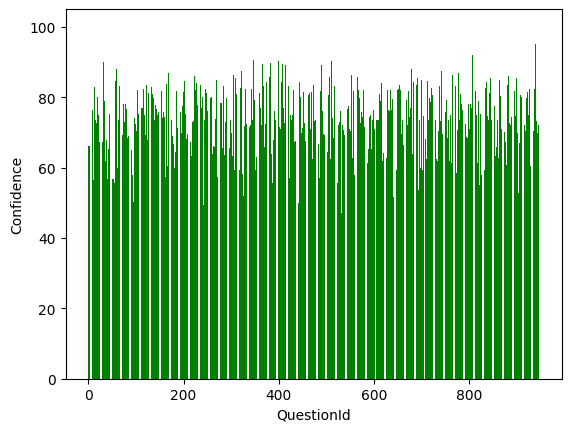

In [20]:
#plotting entropy group by questionId
import matplotlib.pyplot as plt
for i in range(len(final_train_data)):
    plt.bar(i,final_train_data[i][3],color = 'green')
#plt.bar(real_entropy)
plt.xlabel('QuestionId')
plt.ylabel('Confidence')

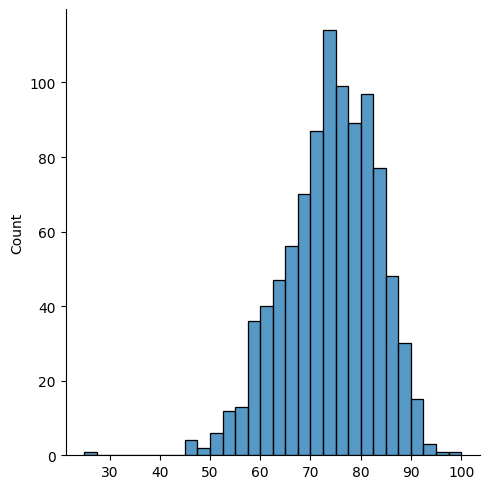

In [21]:
sns.displot(confidence_data)

<Axes: >

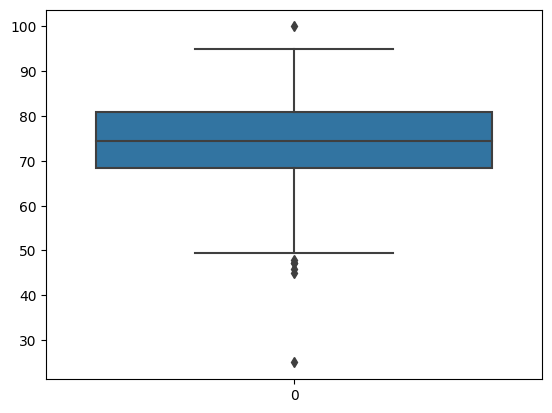

In [22]:
sns.boxplot(confidence_data)

In [23]:
#make csv file

#print(final_train_data[0])
import csv


filename = 'my_train_data.csv'

with open(filename, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows([['QuestionId', 'Correctness', 'Selection Entropy', 'confidence']])
    for row in final_train_data:
        writer.writerow(row)
print(f'CSV 파일인 {filename}이 작성되었습니다.')

my_train_data = pd.read_csv('my_train_data.csv')
#print(my_train_data)

[0, 0.44345661450924606, 1.194456119275689, 66.17647058823529]
CSV 파일인 my_train_data.csv이 작성되었습니다.
     QuestionId  Correctness  Selection Entropy  confidence
0             0     0.443457           1.194456   66.176471
1             1     0.571429           0.876006   73.608704
2             2     0.385214           1.331663   66.201354
3             3     0.808757           0.695423   85.021246
4             4     0.401408           1.324321   59.343434
..          ...          ...                ...         ...
943         943     0.566528           0.958544   83.793687
944         944     0.142857           1.312404   69.852941
945         945     0.422336           1.260934   72.244733
946         946     0.459459           1.236733   72.058824
947         947     0.617124           1.082614   75.240385

[948 rows x 4 columns]


In [24]:
# load evaluators' score on "validation" set
eval_validation = pd.read_csv('data/test_data/quality_response_remapped_public.csv')
print(len(eval_validation))
eval_validation.head()

25


,Unnamed: 0.1,Unnamed: 0,left,right,T1_ALR,T2_CL,T3_GF,T4_MQ,T5_NS
0,0,0,909,318,2,2,2,1.0,2
1,16,16,285,609,2,2,2,2.0,2
2,48,48,132,271,1,2,2,2.0,1
3,38,38,704,127,2,2,1,2.0,2
4,33,33,16,586,1,1,2,2.0,2


In [25]:
# take the average of 5 evaulators` scores
eval_validation['score'] = eval_validation.filter(regex='^T', axis = 1).mean(axis=1)
#eval_validation['score'].hist()
# decide preference
import numpy as np
def calc_preference(scores):
    preference = np.ones(len(scores), dtype=int)

    idx_two = scores > 1.5
    preference[idx_two] = 2
    
    return list(preference)

eval_validation['preference'] = calc_preference(eval_validation['score'])
#print(eval_validation)
cv_data = []
for i in range(len(eval_validation)):
    cv_data.append([eval_validation['left'][i],eval_validation['right'][i],eval_validation['preference'][i]])
print(cv_data)

[[909, 318, 2], [285, 609, 2], [132, 271, 2], [704, 127, 2], [16, 586, 2], [56, 865, 2], [233, 478, 1], [877, 620, 2], [246, 733, 1], [668, 741, 1], [691, 4, 2], [403, 830, 2], [404, 27, 2], [202, 761, 2], [555, 815, 1], [527, 876, 2], [225, 558, 2], [316, 121, 2], [363, 780, 2], [118, 116, 1], [676, 153, 1], [527, 129, 2], [327, 721, 2], [158, 139, 1], [547, 578, 1]]


In [26]:
bb = []
for i in range(len(cv_data)):
    bb.append([final_train_data[cv_data[i][0]],final_train_data[cv_data[i][1]],cv_data[i][2]])
    print([final_train_data[cv_data[i][0]],final_train_data[cv_data[i][1]],cv_data[i][2]])
#print(bb)

[[909, 0.5308641975308642, 1.1126330107049034, 57.69230769230769], [318, 0.5128205128205128, 1.1896758255152484, 59.375], 2]
[[285, 0.6514188903007201, 0.9944803980899994, 72.15116279069767], [609, 0.4526645768025078, 1.2258621348019905, 74.9090909090909], 2]
[[132, 0.38777908343125733, 1.2949304200259486, 73.65384615384616], [271, 0.38748627881448955, 1.335695483315258, 57.35294117647059], 2]
[[704, 0.5774811375507836, 1.087069195088343, 74.76993865030674], [127, 0.43119266055045874, 1.2788125337247216, 81.66666666666667], 2]
[[16, 0.5834782608695652, 1.09043291571841, 83.97435897435898], [586, 0.24676089517078917, 1.3320513717029363, 69.56168831168831], 2]
[[56, 0.5164498852333589, 1.1690720160544665, 80.23858921161826], [865, 0.29743589743589743, 1.324505904052371, 70.54794520547945], 2]
[[233, 0.49002302379125096, 1.1978069741360788, 64.59517045454545], [478, 0.6010362694300518, 1.0256130904781282, 76.97368421052632], 1]
[[877, 0.5142314990512334, 1.220214535076108, 67.350746268656

# Train model using logistic regression

For using Logisitic regression easy I make new csv train dataset like binary(good or bad)
I set good Question by evaluators evaluation(25 data -> 25 good question, 25 bad question)

And, I split 20 good, 20 bad for train and valid for 5 good and 5 bad
After that, I'll make real_train.csv('QuestionId, Confidence, Correctness, Selection Entropy') -> I'll calculate Correctness using df['IsCorrect'], Variance using df['answervalue'] and df['CorrectAnswer']

In [27]:
new_data = []
for item in bb:
    if item[2] == 1:
        item[0].append(1)
        item[1].append(0)
    elif item[2] == 2:
        item[0].append(0)
        item[1].append(1)
    item.pop(2)
    new_data.append(item)

#print(new_data)



[[[909, 0.5308641975308642, 1.1126330107049034, 57.69230769230769, 0], [318, 0.5128205128205128, 1.1896758255152484, 59.375, 1]], [[285, 0.6514188903007201, 0.9944803980899994, 72.15116279069767, 0], [609, 0.4526645768025078, 1.2258621348019905, 74.9090909090909, 1]], [[132, 0.38777908343125733, 1.2949304200259486, 73.65384615384616, 0], [271, 0.38748627881448955, 1.335695483315258, 57.35294117647059, 1]], [[704, 0.5774811375507836, 1.087069195088343, 74.76993865030674, 0], [127, 0.43119266055045874, 1.2788125337247216, 81.66666666666667, 1]], [[16, 0.5834782608695652, 1.09043291571841, 83.97435897435898, 0], [586, 0.24676089517078917, 1.3320513717029363, 69.56168831168831, 1]], [[56, 0.5164498852333589, 1.1690720160544665, 80.23858921161826, 0], [865, 0.29743589743589743, 1.324505904052371, 70.54794520547945, 1]], [[233, 0.49002302379125096, 1.1978069741360788, 64.59517045454545, 1], [478, 0.6010362694300518, 1.0256130904781282, 76.97368421052632, 0]], [[877, 0.5142314990512334, 1.220

In [68]:
flatten_data = [item for sublist in bb for item in sublist]
for i in flatten_data:
    print(i)
#print(len(flatten_data))


[909, 0.5308641975308642, 1.1126330107049034, 57.69230769230769, 0]
[318, 0.5128205128205128, 1.1896758255152484, 59.375, 1]
[285, 0.6514188903007201, 0.9944803980899994, 72.15116279069767, 0]
[609, 0.4526645768025078, 1.2258621348019905, 74.9090909090909, 1]
[132, 0.38777908343125733, 1.2949304200259486, 73.65384615384616, 0]
[271, 0.38748627881448955, 1.335695483315258, 57.35294117647059, 1]
[704, 0.5774811375507836, 1.087069195088343, 74.76993865030674, 0]
[127, 0.43119266055045874, 1.2788125337247216, 81.66666666666667, 1]
[16, 0.5834782608695652, 1.09043291571841, 83.97435897435898, 0]
[586, 0.24676089517078917, 1.3320513717029363, 69.56168831168831, 1]
[56, 0.5164498852333589, 1.1690720160544665, 80.23858921161826, 0]
[865, 0.29743589743589743, 1.324505904052371, 70.54794520547945, 1]
[233, 0.49002302379125096, 1.1978069741360788, 64.59517045454545, 1]
[478, 0.6010362694300518, 1.0256130904781282, 76.97368421052632, 0]
[877, 0.5142314990512334, 1.220214535076108, 67.3507462686567

# Now, Dataset is complete => Use Logistic regression to make classifier

In [29]:
features = []
good_question = []
for i in range(len(flatten_data)):
    features.append(flatten_data[i][1:4])
    good_question.append(flatten_data[i][4])
# print(features)
# print(good_question)
# print(len(features))
# print(len(good_question))

[[0.5308641975308642, 1.1126330107049034, 57.69230769230769], [0.5128205128205128, 1.1896758255152484, 59.375], [0.6514188903007201, 0.9944803980899994, 72.15116279069767], [0.4526645768025078, 1.2258621348019905, 74.9090909090909], [0.38777908343125733, 1.2949304200259486, 73.65384615384616], [0.38748627881448955, 1.335695483315258, 57.35294117647059], [0.5774811375507836, 1.087069195088343, 74.76993865030674], [0.43119266055045874, 1.2788125337247216, 81.66666666666667], [0.5834782608695652, 1.09043291571841, 83.97435897435898], [0.24676089517078917, 1.3320513717029363, 69.56168831168831], [0.5164498852333589, 1.1690720160544665, 80.23858921161826], [0.29743589743589743, 1.324505904052371, 70.54794520547945], [0.49002302379125096, 1.1978069741360788, 64.59517045454545], [0.6010362694300518, 1.0256130904781282, 76.97368421052632], [0.5142314990512334, 1.220214535076108, 67.35074626865672], [0.4231678486997636, 1.2816293827401355, 64.07563025210084], [0.3090909090909091, 1.254277378919

In [142]:
from sklearn.model_selection import train_test_split
train_features, test_features, train_labels, test_labels = train_test_split(features, good_question)

In [143]:
# #print(train_features)
# #print(train_labels)
# print(len(train_features))
# print(len(train_labels))
# #print(test_features)
# #print(test_labels)
# print(len(test_features))
# print(len(test_labels))


37
37
13
13


In [144]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)
test_features = scaler.transform(test_features)

# Test2
No valid_set train all 50 data

In [145]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train_features2 = scaler.fit_transform(features)

In [146]:
from sklearn.linear_model import LogisticRegression
model2 = LogisticRegression()
model2.fit(train_features2, good_question)

LogisticRegression()

In [147]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(train_features, train_labels)

LogisticRegression()

In [33]:
print(model.score(train_features, train_labels))

0.7837837837837838


In [34]:
print(model.score(test_features, test_labels))

0.7692307692307693


In [149]:
print(model2.coef_)

[[-0.13852715  1.2728389  -0.07716883]]


In [35]:
print(model.coef_)


[[ 0.02319349  1.24111149 -0.18706215]]
<bound method LinearClassifierMixin.decision_function of LogisticRegression()>


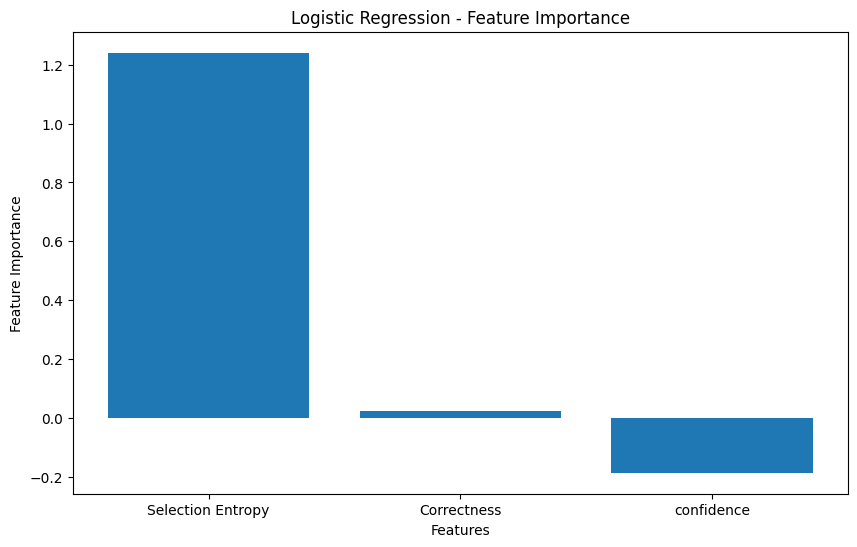

In [36]:
import matplotlib.pyplot as plt
import numpy as np

# 피처 중요도
feature_importance = model.coef_[0]

# 피처의 개수
num_features = len(feature_importance)

# 중요도를 내림차순으로 정렬한 인덱스
sorted_indices = np.argsort(feature_importance)[::-1]

# 정렬된 피처 중요도와 피처 이름
sorted_importance = feature_importance[sorted_indices]
sorted_names = np.arange(num_features)[sorted_indices]
#print(sorted_names)
names = ['Correctness', 'Selection Entropy', 'confidence']
feature_names = []
for i in sorted_names:
    feature_names.append(names[i])
# 그래프 그리기
plt.figure(figsize=(10, 6))
plt.bar(range(num_features), sorted_importance)
plt.xticks(range(num_features), feature_names)
plt.xlabel('Features')
plt.ylabel('Feature Importance')
plt.title('Logistic Regression - Feature Importance')
plt.show()


[-0.02617536]


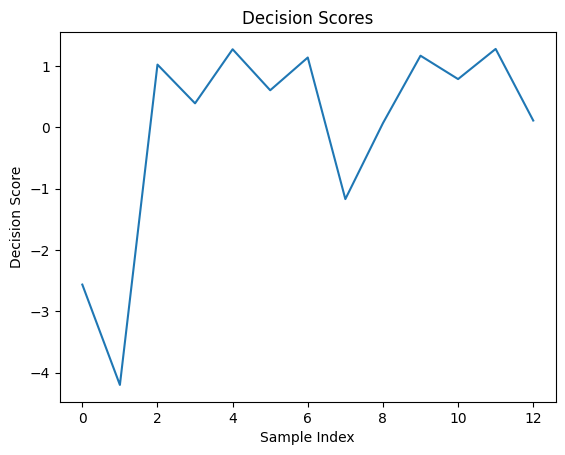

In [ ]:
import matplotlib.pyplot as plt

decision_scores = model.decision_function(test_features)
print(model.intercept_)
# Plot the decision scores
plt.plot(decision_scores)
plt.xlabel('Sample Index')
plt.ylabel('Decision Score')
plt.title('Decision Scores')
plt.show()


# Make final data



In [74]:
import numpy as np

# Load data from CSV file
final_data = np.genfromtxt('my_train_data.csv', delimiter=',', skip_header=1, usecols=(1, 2, 3))


print(len(final_data))

#!Scaling 
final_data = scaler.transform(final_data)


print(final_data)

948
[[-0.6310571   0.44254277 -0.84837765]
 [ 0.22613991 -1.10008981 -0.01674411]
 [-1.02118467  1.10719936 -0.84559335]
 ...
 [-0.77252752  0.7645758  -0.16936637]
 [-0.52386494  0.64733787 -0.19016876]
 [ 0.53222512 -0.09923898  0.16583364]]


# Get Rank using fitted model

In [159]:
#Using model2
model2.predict(final_data)
rank2 = model2.predict_proba(final_data)
#print(rank2)

[[0.36096182 0.63903818]
 [0.82853103 0.17146897]
 [0.18678745 0.81321255]
 ...
 [0.27922941 0.72077059]
 [0.31729715 0.68270285]
 [0.58851275 0.41148725]]


In [102]:
model.predict(final_data)
rank = model.predict_proba(final_data)
#print(rank)

[[0.4077729  0.5922271 ]
 [0.84251815 0.15748185]
 [0.23352312 0.76647688]
 ...
 [0.34466804 0.65533196]
 [0.37596427 0.62403573]
 [0.61348183 0.38651817]]
[0.13749102 0.86250898]


In [161]:
final_rank2 = np.argsort(rank2[:, 1])[::-1]
print(final_rank2)


[273 575 641 775 276 110 857  93  68 846 711  33 757 142 777 762 818 268
 752 718 179 351 316 387 146 702 181 241 598 932 543 588 307 324 493 663
  40 470 560 878 743 358 699 628  70 623 769 843 879 418 670  18 425  61
  77 437 242 822  67 166 286 661 186 159 611 495 624 538  94 206 759 218
 647 559 640   7 851 904 189 442 734 800  95 793  63 882 197 310 192 338
 618 925 237 849 471 913 586 271 112 126 148 824 172 161 771  42 339 944
 174 703 128 240 906 258 223 483 918 162 136 423  84  10 680 725 698 774
  79 531 709 329 708 821 875 371   2 865   4 456 279 504 455 903 580 210
 434 748  48 230 556 388 149 428 500 632 152 613 605 322 869 491 797 498
 667 416 842 528 356 262 120 215 188 180 929 282 217 524 384 729 124 719
 107 208 167 361 936 789 390 694 915 589 919 895  36 399 674 886 415 535
 378  85 883 874  96  44 701 541 732   8  58 876 534 229 169  54 212 228
 587 766 931 537 671 856 201 426 334 226 801 380 891  46  17 382  21 362
 269  60  32 619 263 555 225 873  71 827 799 902 89

In [101]:
final_rank = np.argsort(rank[:, 1])[::-1]
print(final_rank)


[775 273 641 932 777 268 575 769 470 387 242 316 276  40 241 324 711 702
 186 351  93 110  95  67 181 857 640  68 142 670 822 560 358 159 762 624
  70 307 846 437 818 628 878 559 493  77 179 904 166 271 759   7 442 647
 543  18 588 623 189 286 879 663 752 310 800 757  33 162  61 197 491 237
 174 471  10 718 423 206 699 483 146 618 882 148 418   4 743 611 821 734
 774 748 524 495 918  42 849 538 434 218 371 913 906 338 725 851 167 598
 136  94 613 698   2 532 793 279  84  85 929 869  48 388 667 210 456 217
 694 329 416 771  63 903 531 843  36 498 455 172 188 732 661 152 587 605
 415 112 169 215 161 586 258 361 390 425 680  54 326 709 356  79 192 875
 535 556 124 824 230 674 632 339 589  11 895 334 500 797 120 384 226 504
  58 555 212 925 865 240 874 915 826 919 262 708  55 701 703 428 399 833
  49 873 263 282  62 289  71   8 766 228 378 107  96 534 944 580  53 671
 126 620 604 201 380 719 936 902 729  17 583 265 385 789 755 573 235 101
 445 856 208 205 528 827  23 876 541 353 297 128 80

In [167]:
submit2 = np.ones(len(final_rank2))
for i in range(len(final_rank2)):
    submit2[final_rank2[i]] = i


In [168]:
submit = np.ones(len(final_rank))
for i in range(len(final_rank)):
    submit[final_rank[i]] = i


In [169]:
#make submission as answer_ranking
submission_df2 = pd.read_csv("../submission/template.csv")
submission_df2['ranking'] = submit2
submission_df2.to_csv("../submission/answer_ranking2", index=False)


In [170]:
#make submission as answer_ranking
submission_df = pd.read_csv("../submission/template.csv")
submission_df['ranking'] = submit
submission_df.to_csv("../submission/answer_ranking", index=False)


# Test accuracy using answer_ranking

In [171]:
real_test_data = pd.read_csv("data/test_data/quality_response_remapped_private.csv")
# take the average of 5 evaulators` scores
real_test_data['score'] = real_test_data.filter(regex='^T', axis = 1).mean(axis=1)
real_test_data['preference'] = calc_preference(real_test_data['score'])
test_csv = []
for i in range(len(real_test_data)):
    test_csv.append([real_test_data['left'][i],real_test_data['right'][i],real_test_data['preference'][i]])
print(test_csv)

[[145, 762, 2], [307, 208, 1], [278, 195, 1], [13, 153, 2], [23, 100, 1], [532, 104, 1], [155, 479, 1], [304, 907, 1], [242, 129, 1], [688, 287, 2], [289, 72, 2], [40, 219, 1], [184, 606, 2], [439, 430, 1], [394, 95, 1], [744, 74, 1], [432, 340, 2], [611, 104, 2], [376, 172, 2], [515, 357, 1], [570, 428, 2], [361, 836, 1], [365, 381, 2], [740, 223, 1], [798, 851, 2]]


In [172]:
acc2 = []
for i in range(len(test_csv)):
    print(f'left_rank : {submit2[test_csv[i][0]]}, right_rank : {submit2[test_csv[i][1]]}')
    if submit2[test_csv[i][0]] < submit[test_csv[i][1]]:
        acc2.append(1)
    else:
        acc2.append(2)
print(acc2)

left_rank : 447.0, right_rank : 15.0
left_rank : 32.0, right_rank : 181.0
left_rank : 590.0, right_rank : 865.0
left_rank : 821.0, right_rank : 932.0
left_rank : 280.0, right_rank : 762.0
left_rank : 273.0, right_rank : 306.0
left_rank : 262.0, right_rank : 416.0
left_rank : 645.0, right_rank : 931.0
left_rank : 56.0, right_rank : 360.0
left_rank : 874.0, right_rank : 841.0
left_rank : 323.0, right_rank : 596.0
left_rank : 36.0, right_rank : 399.0
left_rank : 666.0, right_rank : 900.0
left_rank : 312.0, right_rank : 296.0
left_rank : 888.0, right_rank : 82.0
left_rank : 513.0, right_rank : 438.0
left_rank : 723.0, right_rank : 499.0
left_rank : 64.0, right_rank : 306.0
left_rank : 772.0, right_rank : 102.0
left_rank : 326.0, right_rank : 760.0
left_rank : 630.0, right_rank : 151.0
left_rank : 183.0, right_rank : 507.0
left_rank : 486.0, right_rank : 783.0
left_rank : 452.0, right_rank : 114.0
left_rank : 785.0, right_rank : 76.0
[2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 2, 1, 2,

In [173]:
acc = []
for i in range(len(test_csv)):
    print(f'left_rank : {submit[test_csv[i][0]]}, right_rank : {submit[test_csv[i][1]]}')
    if submit[test_csv[i][0]] < submit[test_csv[i][1]]:
        acc.append(1)
    else:
        acc.append(2)
print(acc)

left_rank : 450.0, right_rank : 34.0
left_rank : 37.0, right_rank : 236.0
left_rank : 594.0, right_rank : 862.0
left_rank : 816.0, right_rank : 933.0
left_rank : 240.0, right_rank : 763.0
left_rank : 113.0, right_rank : 411.0
left_rank : 401.0, right_rank : 414.0
left_rank : 638.0, right_rank : 931.0
left_rank : 10.0, right_rank : 338.0
left_rank : 873.0, right_rank : 833.0
left_rank : 203.0, right_rank : 581.0
left_rank : 13.0, right_rank : 399.0
left_rank : 666.0, right_rank : 904.0
left_rank : 416.0, right_rank : 345.0
left_rank : 886.0, right_rank : 22.0
left_rank : 485.0, right_rank : 451.0
left_rank : 728.0, right_rank : 478.0
left_rank : 87.0, right_rank : 411.0
left_rank : 769.0, right_rank : 137.0
left_rank : 295.0, right_rank : 767.0
left_rank : 629.0, right_rank : 195.0
left_rank : 151.0, right_rank : 493.0
left_rank : 535.0, right_rank : 790.0
left_rank : 443.0, right_rank : 255.0
left_rank : 761.0, right_rank : 105.0
[2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 2, 2, 1, 2

In [174]:
final_test_acc2 = []
for i in range(len(test_csv)):
    if acc2[i] == test_csv[i][2]:
        final_test_acc2.append(1)
    else:
        final_test_acc2.append(0)

print(f"final accuracy : {np.mean(final_test_acc2)}")

final accuracy : 0.68


In [175]:
final_test_acc = []
for i in range(len(test_csv)):
    if acc[i] == test_csv[i][2]:
        final_test_acc.append(1)
    else:
        final_test_acc.append(0)

print(f"final accuracy : {np.mean(final_test_acc)}")

final accuracy : 0.64
